In [34]:
%load_ext autoreload
%autoreload 2
import torch
from tqdm import tqdm
from collections import OrderedDict
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.models.feature_extraction import get_graph_node_names
from torchvision.models.feature_extraction import create_feature_extractor
import pandas as pd
import numpy as np
import random

from cluster_analysis import *
from embeddings import *
from distances import *
from eval_utils import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [35]:
device = None
if torch.cuda.is_available():
  device = torch.device('cuda:1')
  print("Using GPU")
else:
  device = torch.device('cpu')
  print("Using CPU")

Using GPU


In [36]:
dim = 512

# MERU/CLIP

In [37]:
checkpoint_path = f'./checkpoints/meru{dim}_vit_l.pth' # location of meru checkpoint
train_config = f'./meru/configs/train_meru{dim}_vit_l.py' # location of meru model config
meru = load_meru(checkpoint_path, train_config, device)   

2023-11-04 14:57:24.078 | INFO     | meru.utils.checkpointing:load:142 - Rank 0: Loading checkpoint from ./checkpoints/meru512_vit_l.pth
2023-11-04 14:57:25.128 | INFO     | meru.utils.checkpointing:load:152 - Rank 0: Loading model from ./checkpoints/meru512_vit_l.pth
2023-11-04 14:57:25.374 | INFO     | meru.utils.checkpointing:load:161 - Rank 0: optimizer not found in `checkpointables`.
2023-11-04 14:57:25.375 | INFO     | meru.utils.checkpointing:load:161 - Rank 0: scheduler not found in `checkpointables`.
2023-11-04 14:57:25.375 | INFO     | meru.utils.checkpointing:load:161 - Rank 0: scaler not found in `checkpointables`.


In [38]:
checkpoint_path = f'./checkpoints/clip{dim}_vit_l.pth' # location of clip checkpoint
train_config = f'./meru/configs/train_clip{dim}_vit_l.py' # location of clip config
clip = load_clip(checkpoint_path, train_config, device)

2023-11-04 14:57:28.662 | INFO     | meru.utils.checkpointing:load:142 - Rank 0: Loading checkpoint from ./checkpoints/clip512_vit_l.pth
2023-11-04 14:57:29.689 | INFO     | meru.utils.checkpointing:load:152 - Rank 0: Loading model from ./checkpoints/clip512_vit_l.pth
2023-11-04 14:57:29.936 | INFO     | meru.utils.checkpointing:load:161 - Rank 0: optimizer not found in `checkpointables`.
2023-11-04 14:57:29.937 | INFO     | meru.utils.checkpointing:load:161 - Rank 0: scheduler not found in `checkpointables`.
2023-11-04 14:57:29.937 | INFO     | meru.utils.checkpointing:load:161 - Rank 0: scaler not found in `checkpointables`.
2023-11-04 14:57:29.938 | INFO     | meru.utils.checkpointing:load:161 - Rank 0: root not found in `checkpointables`.


In [39]:
imagenet_labels = []
with open('../datasets/imagenet-labels.txt') as f:
    for row in f:
        imagenet_labels.append(row.strip())

# BREEDs

In [40]:
from robustness.tools.breeds_helpers import setup_breeds
from robustness.tools.breeds_helpers import ClassHierarchy
from robustness.tools.breeds_helpers import BreedsDatasetGenerator
import os

data_dir = '/mnt/nvme0n1p2/data/ImageNet-1K'
info_dir = '../datasets/breeds_info'
dataset_info = torch.load('./files/dataset_info.pt')
dataset_name = 'ds11_r3_l5'
breeds_loader, val_subclass_labels, superclasses, subclass_split, label_map = load_breeds(dataset_name,
                                                                                         dataset_info,
                                                                                         data_dir)

==> Preparing dataset custom_imagenet..


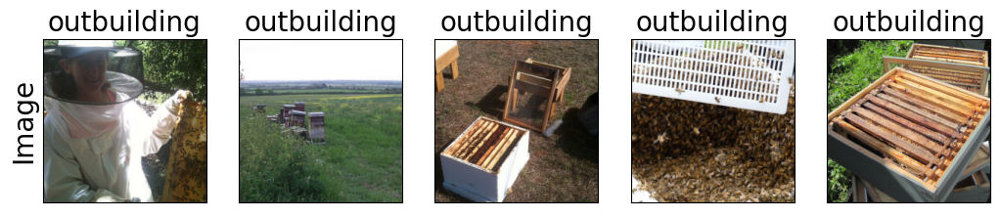

1000


In [41]:
from robustness.tools.vis_tools import show_image_row

for domain, loader in zip(["Image"], [breeds_loader]):
    im, lab = next(iter(loader))
    show_image_row([im], 
                 tlist=[[label_map[int(k)].split(",")[0] for k in lab]],
                 ylist=[domain],
                 fontsize=20)
print(len(breeds_loader.dataset))

# Embeddings

In [42]:
model = meru # set to clip if using clip
embed_dict = embed_breeds_meip(f'./embeds/meru{dim}_hyperbolic_{dataset_name}.pt', 
                                           model, 
                                           breeds_loader, 
                                           val_subclass_labels)
# embed_dict = embed_dict = embed_breeds_meip(f'./embeds/clip{dim}_spherical_{dataset_name}.pt', 
#                                            model, 
#                                            breeds_loader, 
#                                            val_subclass_labels)

embedding breeds...


Extracting image feats: 100%|█████████████████████████████████████████████████████████| 200/200 [00:12<00:00, 16.11it/s]


In [43]:
cost_loc = f'./files/{dataset_name}_image_costs.pt' # location for dataset image costs
embed_loc = f'./files/resnet_{dataset_name}.pt' # location to store embeds
image_costs = load_image_costs(cost_loc, embed_loc, breeds_loader, device)

# Analysis

In [44]:
# Convert elements to integers if not already
embed_dict['labels'] = ltensor_to_lint(embed_dict['labels'])
embed_dict['subclass_labels'] = ltensor_to_lint(embed_dict['subclass_labels'])
n_subclasses = dataset_info[dataset_name]['n_subclasses']
n_superclasses = dataset_info[dataset_name]['n_superclasses'] 

In [45]:
subclass_accuracy, superclass_accuracy = clip_acc(model, dataset_name, val_subclass_labels)
print(f'Superclass: {superclass_accuracy}')
print(f'Subclass: {subclass_accuracy}')

==> Preparing dataset custom_imagenet..


/home/ethans/miniconda3/lib/python3.10/site-packages/torch/nn/modules/activation.py:1160: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at /opt/conda/conda-bld/pytorch_1682343995026/work/aten/src/ATen/native/transformers/attention.cpp:150.)
  return torch._native_multi_head_attention(
Extracting image feats: 100%|█████████████████████████████████████████████████████████████| 8/8 [00:12<00:00,  1.54s/it]

Superclass: 46.5
Subclass: 43.7


In [46]:
cdm = generate_cdm(model, embed_dict['embed'], device) # for meru
# cdm = pdist(embed_dict['embed']) # for clip
subclass_clustering, superclass_clustering = cluster(cdm, 
                                                     embed_dict['embed'],
                                                     n_subclasses,
                                                     n_superclasses)

# Clustering

In [47]:
subclass_ami, subclass_purity = metrics(embed_dict['subclass_labels'], subclass_clustering)
print('ami:', subclass_ami)
print('purity:', subclass_purity)

ami: 0.6077680757178878
purity: 0.624


In [48]:
superclass_ami, superclass_purity = metrics(embed_dict['labels'], superclass_clustering)
print('ami:', superclass_ami)
print('purity:', superclass_purity)

ami: 0.5443030919990174
purity: 0.611


# Merges

In [49]:
m = dict(sorted(find_merges(embed_dict['subclass_labels'], superclass_clustering).items()))
matches, non_matches = separate_on_matches(m, subclass_split[0])

In [50]:
superclass_modes = np.array(imagenet_labels)[cluster_mode(superclass_clustering, embed_dict['subclass_labels']).ravel()]
subclass_modes = np.array(imagenet_labels)[cluster_mode(subclass_clustering, embed_dict['subclass_labels']).ravel()]
def visualize_merge(merges, spherical, imagenet_labels, label_map, ds, centroids, general = False):
    """
    For each merge, displays random image from each subclass. 
    Input:
    - merges: {c2_i1: {c1_i1: [i1, i2,...], c1_i2: [i1, i2, ...], ...}, ...}
    - spherical: {'embed': array-like (n_samples, dim), 
                 'labels': [n_samples, ], 
                 'preds': [n_samples, ], 
                 'subclass_labels': [n_samples, ]}
    - imagenet_labels: (n_samples, )
    - label_map: {c2_i: name, c2_i: name, ...}
    - ds: 
    - centroids: (n_superclasses, ) of centroid classifications
    - general: label subclasses with general superclass
    Requires:
    centroids indices match indices in merges
    """
    for k, v in merges.items():
        domain = k
        ims = None
        lab = None
        sublab = None
        count = []
        for k1, v1 in v.items():
            im_idx = random.choice(v1)
            im = ds[im_idx]
            tmp_im = im[0].unsqueeze(dim=0)
            tmp_l = torch.as_tensor(im[1]).unsqueeze(dim=0)
            tmp_subl = torch.as_tensor(spherical['subclass_labels'][im_idx]).unsqueeze(dim=0)
            if ims == None and lab == None:
                ims = tmp_im
                lab = tmp_l
                sublab = tmp_subl
            else:
                ims = torch.cat([ims, tmp_im], dim=0) # ims to display in row
                lab = torch.cat([lab, tmp_l], dim=0) # superclass label of each im
                sublab = torch.cat([sublab, tmp_subl], dim=0) # subclass label of each im
            count.append(len(v1)) # count of each class in the merge
            
        ims = torch.as_tensor(ims)
        lab = torch.as_tensor(lab)
        # tlist=[label_map[int(k)].split(",")[0] + f"({c})" for k, c in zip(lab, count)], # superclass
        tlist=[imagenet_labels[k.item()].split(",")[0] + f"({c})" for k, c in zip(torch.ravel(sublab), count)], # subclass name + count
        show_image_row([ims], 
                     size=(2, 2),
                     # tlist=[[label_map[int(k)].split(",")[0] for k in lab]], # superclass
                     tlist=tlist, # subclass
                     ylist=[centroids[k].split(",")[0]],
                     fontsize=14)

In [51]:
visualize_merge(matches, 
                embed_dict, 
                imagenet_labels, 
                label_map, 
                breeds_loader.dataset,
                superclass_modes)

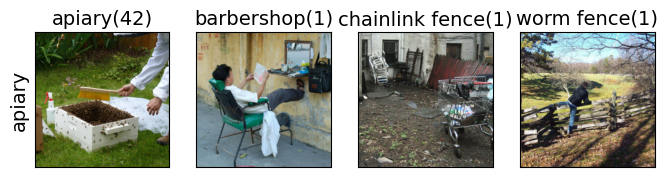

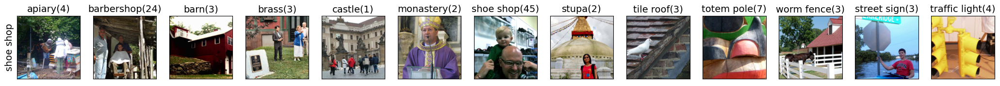

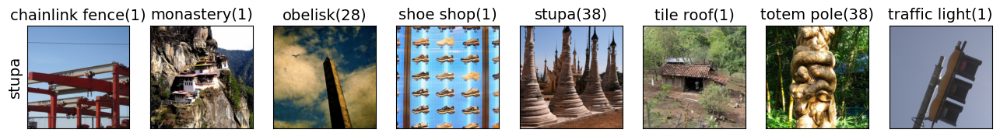

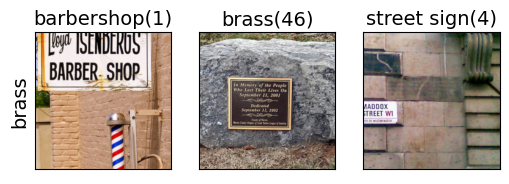

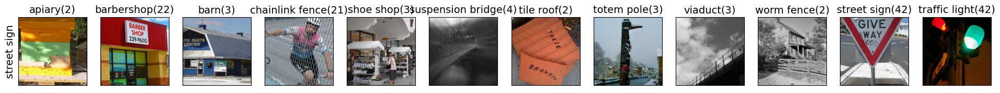

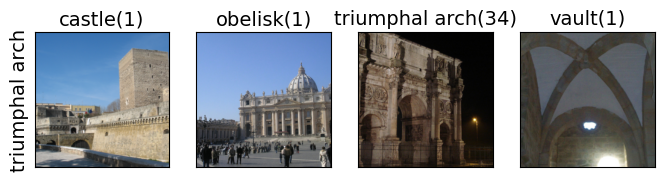

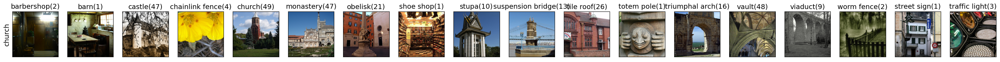

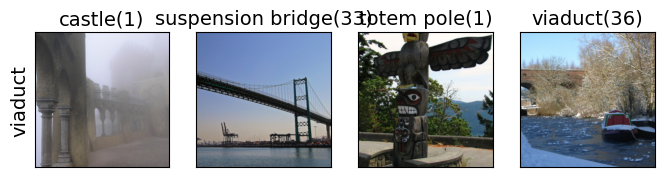

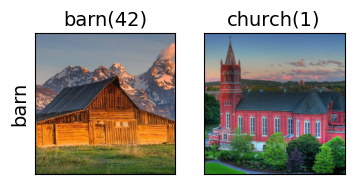

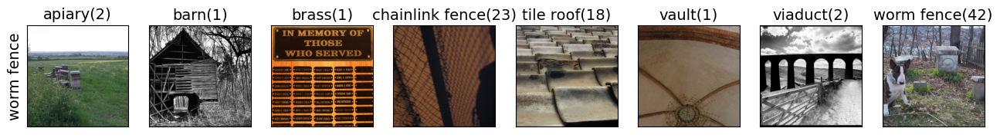

In [52]:
visualize_merge(non_matches, 
                embed_dict, 
                imagenet_labels, 
                label_map, 
                breeds_loader.dataset,
                superclass_modes)

# Subclass Image Analysis

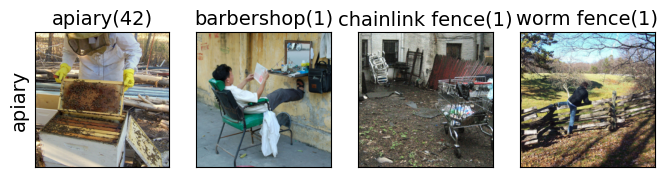

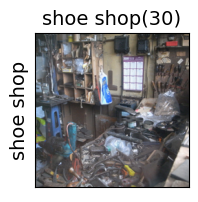

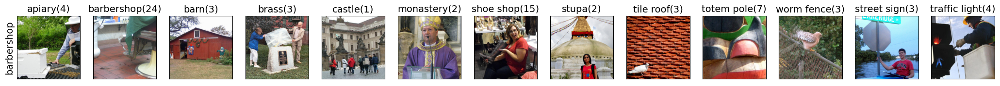

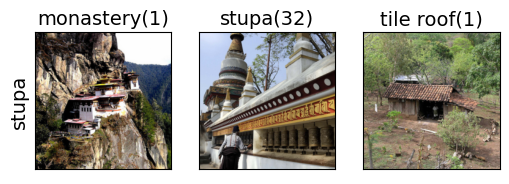

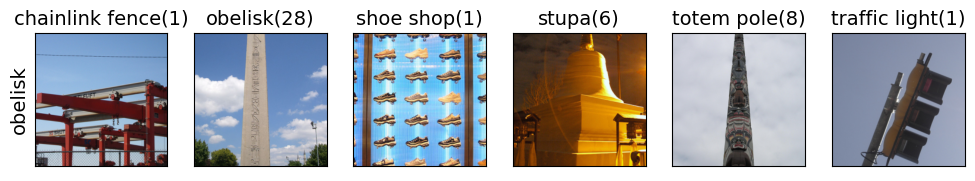

...

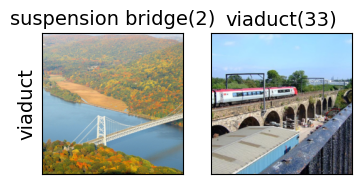

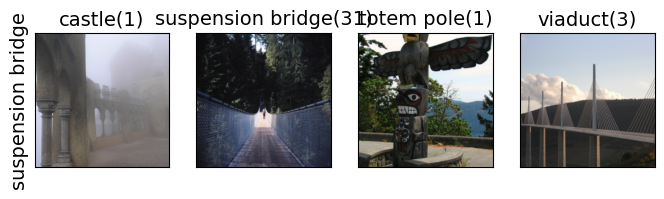

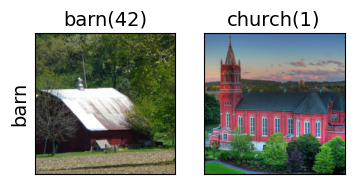

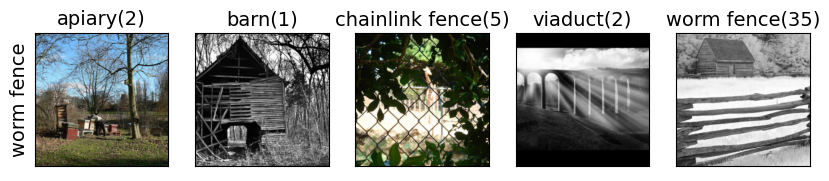

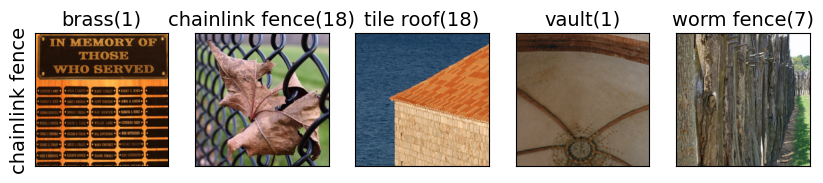

In [53]:
m = dict(sorted(find_merges(embed_dict['subclass_labels'], subclass_clustering).items()))
visualize_merge(m, 
                embed_dict, 
                imagenet_labels, 
                label_map,
                breeds_loader.dataset,
                subclass_modes)

# Distance

In [54]:
superclass_distance, _ = hhot(embed_dict['labels'], superclass_clustering, image_costs)
subclass_distance, subclass_dist = hhot(embed_dict['subclass_labels'], subclass_clustering, image_costs)
true_superclass_merge = dict(sorted(find_merges(embed_dict['subclass_labels'], embed_dict['labels']).items()))
pred_superclass_merge = dict(sorted(find_merges(subclass_clustering, superclass_clustering).items()))
h2_distance = hhot_h2(subclass_dist, true_superclass_merge, pred_superclass_merge)
h2_distance

0.9331093582269515